##도입
이 노트북은 __Tensorflow 2 Object Detection API__ 와 Tessorflow hub의 __image feature vector model__를 활용하여 한 사람의 과거 식단 이미지 중 동일한 식단의 이미지를 유사한 순으로 나열해주는 모델 도입을 위한 feasibility test입니다.


## Tensorflow 2 Object Detection API 준비

In [1]:
import os
import pathlib
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2159, done.
remote: Counting objects: 100% (2159/2159), done.
remote: Compressing objects: 100% (1860/1860), done.
remote: Total 2159 (delta 509), reused 950 (delta 275), pack-reused 0
Receiving objects: 100% (2159/2159), 30.38 MiB | 26.93 MiB/s, done.
Resolving deltas: 100% (509/509), done.


In [2]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1568035 sha256=51f3e3caa4ab2d7c34672224a39707768d40244f1ed3118b4b77fa9b14af7c28
  Stored in directory: /tmp/pip-ephem-wheel-cache-12x6ycx7/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.0-cp36-none-any.whl size=43735 sha256=d29f20765b3e1671ad659d26fb3b623ecb691ce4bac60a66c31b5eb4ab7b098e
  Stored in directory: /root/.cache/pip/wheels/3f/15/cd/fe4ec8b88c130393464703ee8111e2cddebdc40e1b59ea85e9
  Created wheel for hdfs: filename=hdfs-2.5.8-cp36-none-any.whl size=33213 sha256=3666d7d3ab05bdc94fe2b9eef3b31fca542d741f44b15aef914d67c2c60da791
  Stored in directory: /root/.cache/pip/wheels/fe/a7/05/23e3699975fc20f8a30e00ac1e515ab8c61168e982abe4ce70
  Created wheel for oauth2client: filename=oauth2client-3.0.0-cp36-none-any.whl size=106382 sha256=c015e7dfed440bc93db08f4ea22a452148ed2e20b7e

ERROR: pydrive 1.3.1 has requirement oauth2client>=4.0.0, but you'll have oauth2client 3.0.0 which is incompatible.
ERROR: multiprocess 0.70.10 has requirement dill>=0.3.2, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: apache-beam 2.23.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1; python_version >= "3.0", but you'll have avro-python3 1.10.0 which is incompatible.


In [3]:
# Loading packages
import matplotlib
import matplotlib.pyplot as plt

import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf
import tensorflow_hub as hub

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [4]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2020-09-07 15:27:51.305731: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-09-07 15:27:53.275700: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-07 15:27:53.315153: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-07 15:27:53.315797: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-09-07 15:27:53.315840: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] 

In [5]:
# Copied functions of https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD#scrollTo=VA7Zbo3RLt3W&uniqifier=1
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

## Tensorflow 2 Object Detection Training data 준비
__LabelIMG__를 활용하여 train할 데이터를 라벨링한 후, __Roboflow__를 통해 custom dataset에 대한 __TFRecords__와 __label_map__을 생성한다.

In [6]:
# Downloading data from Roboflow
%cd /content
!curl -L "https://app.roboflow.com/ds/rCDnME0WLZ?key=ParP2w09I7" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip # This is my personal roboflow link

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   891  100   891    0     0   1427      0 --:--:-- --:--:-- --:--:--  1425
100 17.4M  100 17.4M    0     0  16.1M      0  0:00:01  0:00:01 --:--:-- 16.1M
Archive:  roboflow.zip
 extracting: test/diet.tfrecord      
 extracting: train/diet.tfrecord     
 extracting: valid/diet.tfrecord     
 extracting: test/diet_label_map.pbtxt  
 extracting: train/diet_label_map.pbtxt  
 extracting: valid/diet_label_map.pbtxt  
 extracting: README.roboflow.txt     


In [7]:
test_record_fname = '/content/valid/diet.tfrecord'
train_record_fname = '/content/train/diet.tfrecord'
label_map_pbtxt_fname = '/content/train/diet_label_map.pbtxt'

## Tensorflow 2 Object Detection Training Configuration 설정

In [8]:
# Models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 16
    }
}

# In this notebook, I implement the lightweight, smallest state of the art efficientdet model
chosen_model = 'efficientdet-d0'

num_steps = 25000 
num_eval_steps = 500

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [9]:
# Download pretrained weights
%mkdir/content/models/research/deploy/
%cd /content/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/models/research/deploy
--2020-09-07 15:28:35--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.142.128, 2607:f8b0:400e:c09::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.142.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   103MB/s    in 0.3s    

2020-09-07 15:28:36 (103 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [10]:
# Download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/research/deploy
--2020-09-07 15:28:36--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2020-09-07 15:28:37 (55.3 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [11]:
# Prepare
pipeline_fname = '/content/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)

In [12]:
# Write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /content/drive/My Drive/Colab Notebooks/diet-detector/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)

[Errno 2] No such file or directory: '/content/drive/My Drive/Colab Notebooks/diet-detector/models/research/deploy'
/content/models/research/deploy
writing custom configuration file


In [13]:
%cat /content/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 17
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      

In [14]:
pipeline_file = '/content/models/research/deploy/pipeline_file.config'
model_dir = '/content/training/'

## Custom Tensorflow 2 Object Detection 학습

In [15]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2020-09-07 15:28:38.043652: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-07 15:28:40.015913: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-07 15:28:40.029546: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-07 15:28:40.030101: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-09-07 15:28:40.030141: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-07 15:28:40.032044: I tensorflow/stream_executor/pl

In [16]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

## Trained Inference Graph 추출

In [17]:
# See where my model saved weights
%ls '/content/training/'

checkpoint                   ckpt-23.index
ckpt-20.data-00000-of-00001  ckpt-24.data-00000-of-00001
ckpt-20.index                ckpt-24.index
ckpt-21.data-00000-of-00001  ckpt-25.data-00000-of-00001
ckpt-21.index                ckpt-25.index
ckpt-22.data-00000-of-00001  ckpt-26.data-00000-of-00001
ckpt-22.index                ckpt-26.index
ckpt-23.data-00000-of-00001  train/


In [18]:
# Run conversion script
output_directory = '/content/fine_tuned_model'

last_model_path = '/content/training/'
print(last_model_path)
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/content/training/
2020-09-07 22:51:23.307207: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-07 22:51:36.661536: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-07 22:51:36.743571: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-07 22:51:36.744133: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-09-07 22:51:36.744176: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-07 22:51:37.132480: I tensorflow

In [19]:
%ls '/content/fine_tuned_model/saved_model/'

assets/  saved_model.pb  variables/


## Custom Tensorflow 2 Object Detector 실행

In [20]:
# Download test images from Roboflow
%mkdir /content/test/
%cd /content/test/
!curl -L "https://app.roboflow.com/ds/S1fBg3B0HB?key=NyYAs5n4GY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip # This is my personal roboflow link

mkdir: cannot create directory ‘/content/test/’: File exists
/content/test
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0    682      0  0:00:01  0:00:01 --:--:--   683
100 18.6M  100 18.6M    0     0  10.0M      0  0:00:01  0:00:01 --:--:-- 53.8M
Archive:  roboflow.zip
 extracting: test/fb6d99dcb7cc3d2da6fa930145e898d0_jpg.rf.8a1afad933afa7bb6a9c6e404ec35b3a.jpg  
 extracting: test/aa2ac4415f2e74a6dd1f4b65b6cbce02_jpg.rf.0e052bc12a80ee578d249f11481a4ca7.jpg  
 extracting: test/02b8c6e11bc02c7bd746e869db1cd042_jpg.rf.3615fe6048e6db2e27c787d323902947.jpg  
 extracting: test/f83c9ed75135a765cb0abb78965135c3_jpg.rf.50a25f487e10085d2757b1ed8be27b88.jpg  
 extracting: test/c35de8cdf180c8feb99cb6e949100339_jpg.rf.3470e745af3b0304ab1b5d6a054e32b2.jpg  
 extracting: test/bf3e712948a6273b98bb2a24f13b7770_jpg.rf.53c886be105e4ac81b931df3d2cfda4f.jpg  
 ext

In [21]:
%ls '/content/training/'

checkpoint                   ckpt-23.index
ckpt-20.data-00000-of-00001  ckpt-24.data-00000-of-00001
ckpt-20.index                ckpt-24.index
ckpt-21.data-00000-of-00001  ckpt-25.data-00000-of-00001
ckpt-21.index                ckpt-25.index
ckpt-22.data-00000-of-00001  ckpt-26.data-00000-of-00001
ckpt-22.index                ckpt-26.index
ckpt-23.data-00000-of-00001  train/


In [22]:
# Recover saved model
pipeline_config = pipeline_file

model_dir = '/content/training/ckpt-26'
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join('/content/training/ckpt-26'))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [23]:
# Map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

### 이미지 간의 Cosine similarity 분석을 위한 함수와 모델 불러오기 (from Tensorflow hub)

In [24]:
# This function:
# Loads the PNG image at the given path
# Decodes the PNG image to a uint8 W X H X 3 tensor
# Resizes the image to 224 x 224 x 3 tensor
# Returns the pre processed image as 224 x 224 x 3 tensor
#################################################
def load_img(path):

  # Reads the image file and returns data type of string
  img = tf.io.read_file(path)

  # Decodes the image to W x H x 3 shape tensor with type of uint8
  img = tf.io.decode_png(img, channels=3)

  # Resize the image to 224 x 244 x 3 shape tensor
  img = tf.image.resize_with_pad(img, 224, 224)

  # Converts the data type of uint8 to float32 by adding a new axis
  # This makes the img 1 x 224 x 224 x 3 tensor with the data type of float32
  # This is required for the mobilenet model we are using
  img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  return img

In [25]:
# I will use Feature vectors of images with MobileNet V2 trained on ImageNet
module_handle = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" 
f_module = hub.load(module_handle)

### 식단 이미지들 간의 유사성 파악

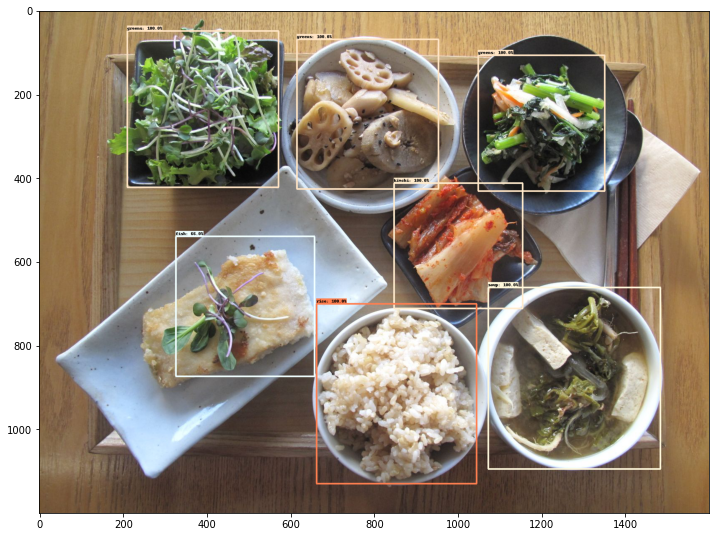

In [84]:
# Run detector on target diet-image
target_image_path = '/content/test/test/31de316694e445cc372cc7b65d69bd92.jpg'
# Extract image features of the target image
target_img_vec = f_module(load_img(target_image_path))
target_np = load_image_into_numpy_array(target_image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(target_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
target_np_with_detections = target_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      target_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.6,
      agnostic_mode=False,
)

# Store detected class names of target image
target_classes = []
detected_num = len(np.where(detections['detection_scores'][0].numpy() > 0.5)[0])
for i in range(0, detected_num):
  detected_id = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)[i]
  detected_name = category_index[detected_id]['name']
  target_classes.append(detected_name)

plt.figure(figsize=(12,16))
plt.imshow(target_np_with_detections)
plt.show()

In [88]:
# Run detector on test diet-images
test_num = 0
detected_classes = []
image_nps = []
for filename in glob.glob('/content/test/test/*.jpg'):
  image_np = load_image_into_numpy_array(filename)
  input_tensor = tf.convert_to_tensor(
      np.expand_dims(image_np, 0), dtype=tf.float32)
  detections, predictions_dict, shapes = detect_fn(input_tensor)
  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.6,
        agnostic_mode=False,
  )
  # Store detected class names of test images
  detected_classes.append([])
  detected_num = len(np.where(detections['detection_scores'][0].numpy() > 0.5)[0])
  for n in range(0, detected_num):
    detected_id = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)[n]
    detected_name = category_index[detected_id]['name']
    detected_classes[test_num].append(detected_name)
  # Extract image features of the input image
  img_vec = f_module(load_img(filename))
  image_nps.append([image_np_with_detections, img_vec, detected_classes[test_num],0,0])
  test_num = test_num + 1
  print("-----------------------------------------------------------------------------------------")
  print("Image count                     :%s" %test_num)

-----------------------------------------------------------------------------------------
Image count                     :1
-----------------------------------------------------------------------------------------
Image count                     :2
-----------------------------------------------------------------------------------------
Image count                     :3
-----------------------------------------------------------------------------------------
Image count                     :4
-----------------------------------------------------------------------------------------
Image count                     :5
-----------------------------------------------------------------------------------------
Image count                     :6
-----------------------------------------------------------------------------------------
Image count                     :7
-----------------------------------------------------------------------------------------
Image count                     :8


In [89]:
# Compare target diet image's objects with test diet images
tclasses = {}
for tclass in target_classes:
  try: tclasses[tclass] += 1
  except: tclasses[tclass] = 1

image_nps = np.array(image_nps)
for i in range(0, test_num):
  test_classes = {}
  for c in image_nps[i][2]:
    try: test_classes[c] += 1
    except: test_classes[c] = 1
  if tclasses == test_classes:
    image_nps[i][3] = 1

In [90]:
# Calculate Cosine-similarity between target_img and input_imgs
# When it is a negative number between -1 and 0, 0 indicates orthogonality and values closer to -1 indicate greater similarity.
# The values closer to 1 indicate greater dissimilarity.
for i in range(0, test_num):
  similarity = tf.keras.losses.cosine_similarity(target_img_vec, image_nps[i][1])
  image_nps[i][4] = similarity
# Sort image_nps by similarity
image_nps = image_nps[image_nps[:,4].argsort()]

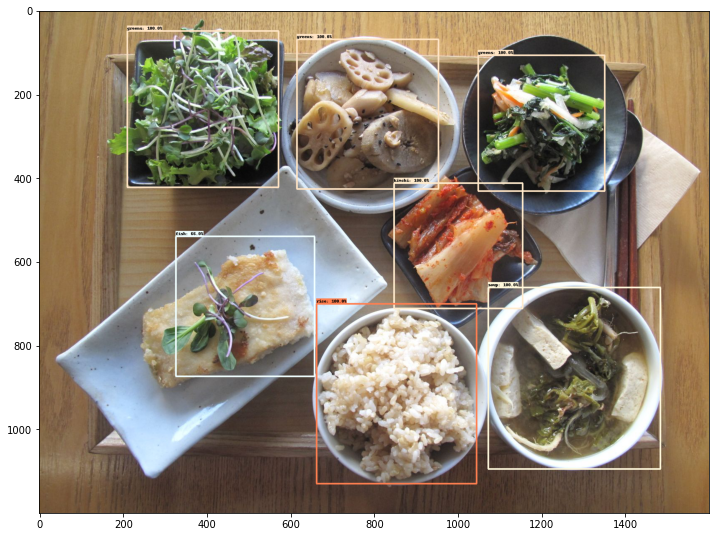

Similarity: -1.000



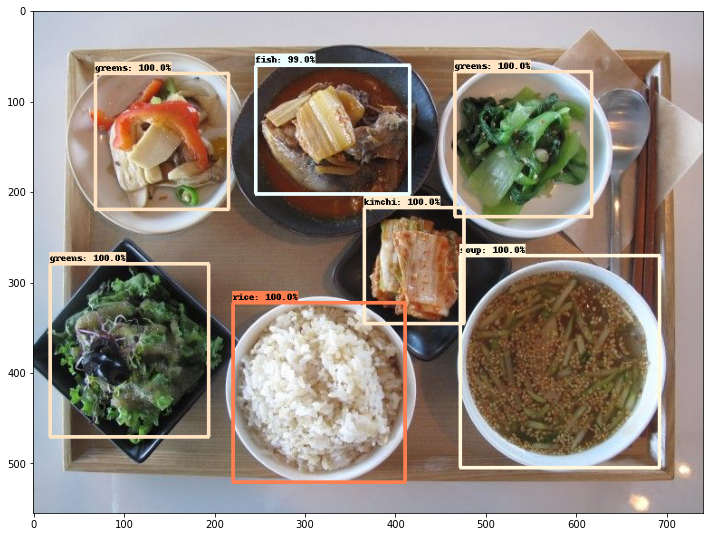

Similarity: -0.919



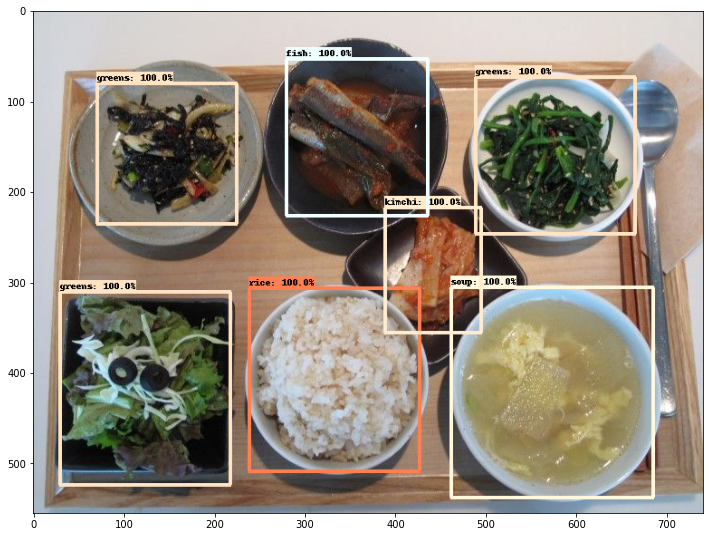

Similarity: -0.913



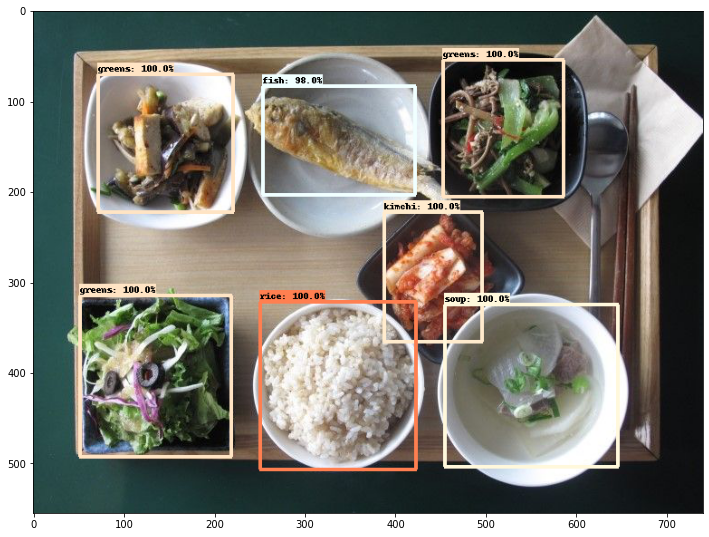

Similarity: -0.889



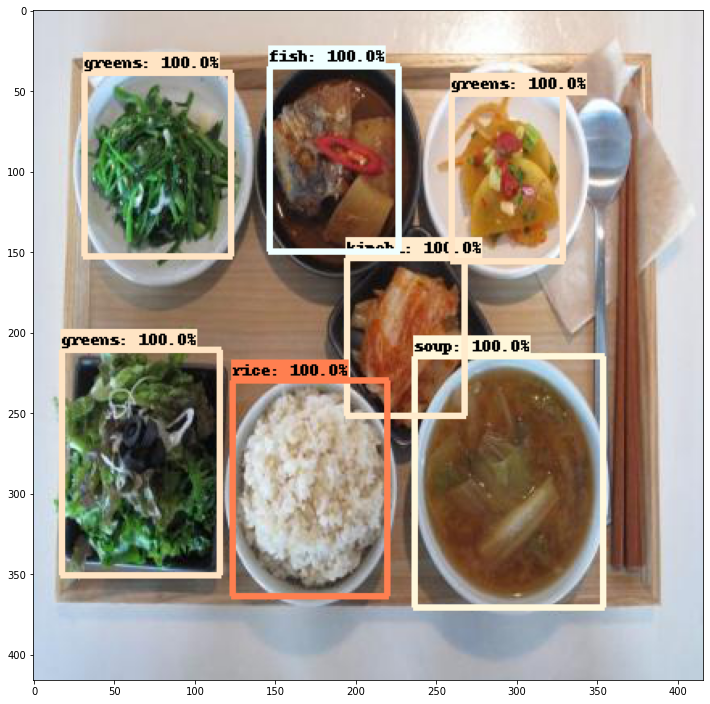

Similarity: -0.726



In [91]:
# Print diet-images similar with the target diet image
# The first one is the target diet image
for i in range(0, test_num):
  if image_nps[i][3] == 1:
    plt.figure(figsize=(12,16))
    plt.imshow(image_nps[i][0])
    plt.show()
    print("Similarity: %.3f\n" %image_nps[i][4])